In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib.colors import ListedColormap
import numpy as np
import plotly.graph_objects as go

In [5]:
import pandas as pd 
data = pd.read_csv("Speed+Dating+Data.csv", encoding='latin1')
data.head()

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
0,1,1.0,0,1,1,1,10,7,NaN,4,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
1,1,1.0,0,1,1,1,10,7,NaN,3,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
2,1,1.0,0,1,1,1,10,7,NaN,10,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
3,1,1.0,0,1,1,1,10,7,NaN,5,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
4,1,1.0,0,1,1,1,10,7,NaN,7,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN


In [6]:
print(df.columns)

NameError: name 'df' is not defined

In [86]:
print(df.describe)

<bound method NDFrame.describe of       iid    id  gender  idg  condtn  wave  round  position  positin1  order  \
0       1   1.0       0    1       1     1     10         7       NaN      4   
1       1   1.0       0    1       1     1     10         7       NaN      3   
2       1   1.0       0    1       1     1     10         7       NaN     10   
3       1   1.0       0    1       1     1     10         7       NaN      5   
4       1   1.0       0    1       1     1     10         7       NaN      7   
...   ...   ...     ...  ...     ...   ...    ...       ...       ...    ...   
8373  552  22.0       1   44       2    21     22        14      10.0      5   
8374  552  22.0       1   44       2    21     22        13      10.0      4   
8375  552  22.0       1   44       2    21     22        19      10.0     10   
8376  552  22.0       1   44       2    21     22         3      10.0     16   
8377  552   NaN       1   44       2    21     22         2      10.0     15   

     

In [87]:
print(df.describe(include=['object']))

           field     undergra    mn_sat    tuition      from zipcode  \
count       8315         4914      3133       3583      8299    7314   
unique       259          241        68        115       269     409   
top     Business  UC Berkeley  1,400.00  26,908.00  New York       0   
freq         521          107       403        241       522     355   

           income   career  
count        4279     8289  
unique        261      367  
top     55,080.00  Finance  
freq          124      202  


In [88]:
missing_values = df.isnull().sum()
print(missing_values)

iid            0
id             1
gender         0
idg            0
condtn         0
            ... 
attr5_3     6362
sinc5_3     6362
intel5_3    6362
fun5_3      6362
amb5_3      6362
Length: 195, dtype: int64


In [89]:
df_match_1 = df[df['match'] == 1]

# Vérifier les valeurs manquantes dans ce sous-ensemble
missing_values = df_match_1.isnull().sum()

# Afficher seulement les colonnes qui ont des valeurs manquantes
missing_values = missing_values[missing_values > 0]
print("Missing values for match=1:")
print(missing_values)

# Compter et afficher les valeurs de match avec les pourcentages
match_counts = df['match'].value_counts()
match_percentages = df['match'].value_counts(normalize=True) * 100

# Afficher les résultats
print("\nMatch counts:")
print(match_counts)
print("\nMatch percentages:")
print(match_percentages)

Missing values for match=1:
positin1     334
int_corr      30
age_o         18
race_o        14
pf_o_att      15
            ... 
attr5_3     1017
sinc5_3     1017
intel5_3    1017
fun5_3      1017
amb5_3      1017
Length: 180, dtype: int64

Match counts:
match
0    6998
1    1380
Name: count, dtype: int64

Match percentages:
match
0    83.528288
1    16.471712
Name: proportion, dtype: float64


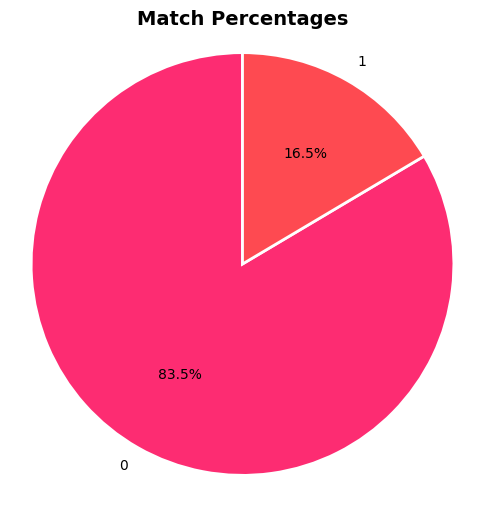

In [90]:
colors = ['#FD2C72', '#FE4A51']  # Couleurs personnalisées

plt.figure(figsize=(6, 6))
plt.pie(match_percentages, labels=match_percentages.index, autopct='%1.1f%%', startangle=90, colors=colors, wedgeprops={'edgecolor': 'white', 'linewidth': 2})
plt.title('Match Percentages', fontsize=14, fontweight='bold')
plt.axis('equal')  # Assurer que le camembert est dessiné comme un cercle.

plt.show()

Number of rows after filtering for match = 1: 1380


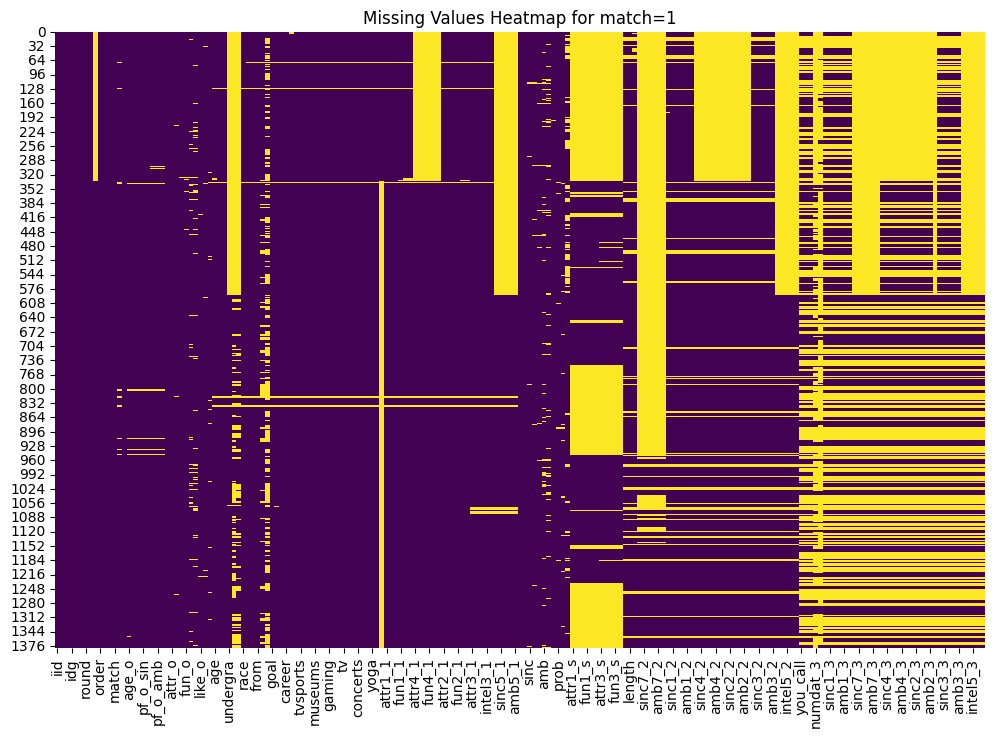

In [91]:
# Filtrer les lignes où match = 1 et réinitialiser l'index
df_match_1 = df[df['match'] == 1].reset_index(drop=True)

# Vérifier le nombre de lignes après le filtrage
print(f"Number of rows after filtering for match = 1: {df_match_1.shape[0]}")

# Visualiser les valeurs manquantes dans df_match_1
plt.figure(figsize=(12, 8))
sns.heatmap(df_match_1.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap for match=1')
plt.show()

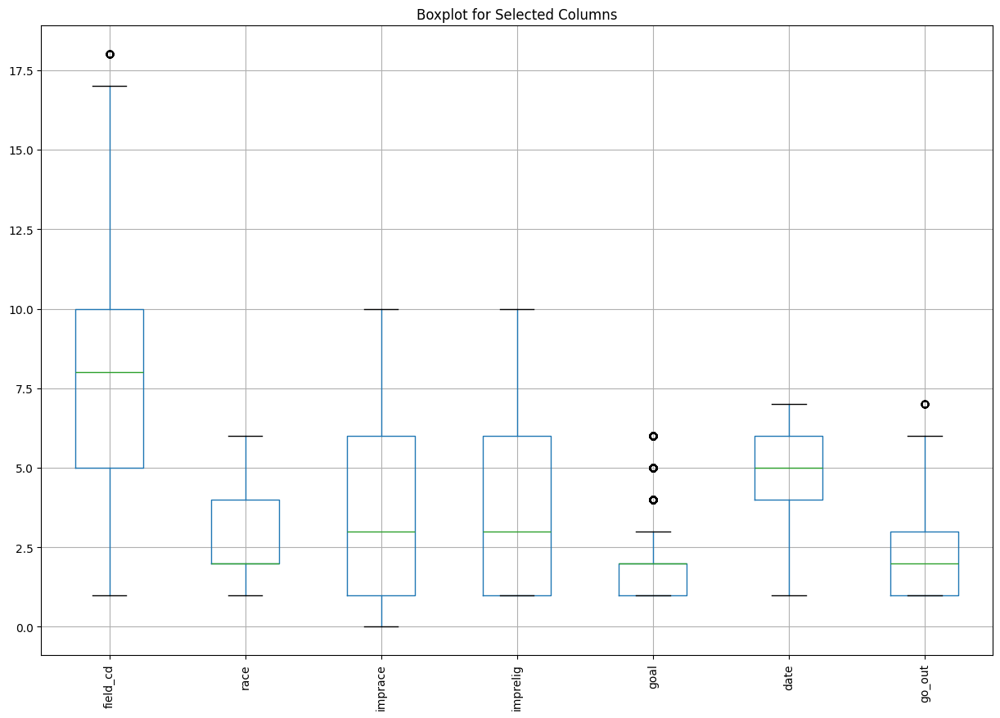

In [92]:
# Specify the columns you want to plot
columns_to_plot = ['field_cd', 'race', 'imprace', 'imprelig', 'goal', 'date', 'go_out', 'career']

# Plot a boxplot for the selected columns
df[columns_to_plot].boxplot(figsize=(15, 10))

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.title('Boxplot for Selected Columns')
plt.show()

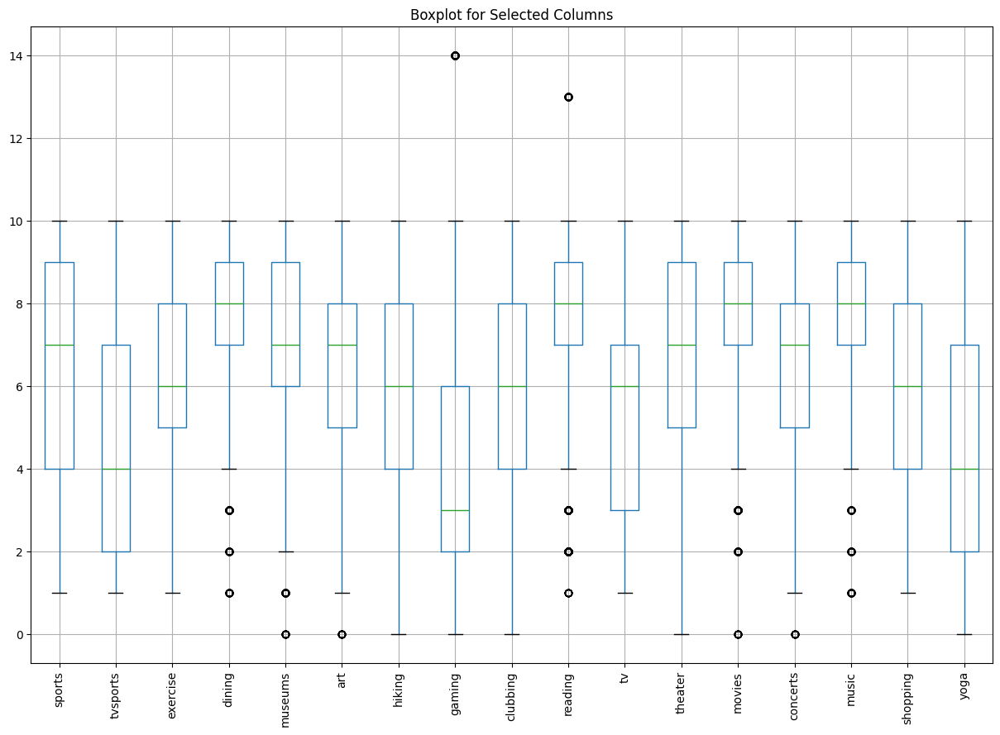

In [93]:
# Specify the columns you want to plot
columns_to_plot = ['sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 'clubbing',
                       'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga']

# Plot a boxplot for the selected columns
df[columns_to_plot].boxplot(figsize=(15, 10))

# Rotate the x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.title('Boxplot for Selected Columns')
plt.show()

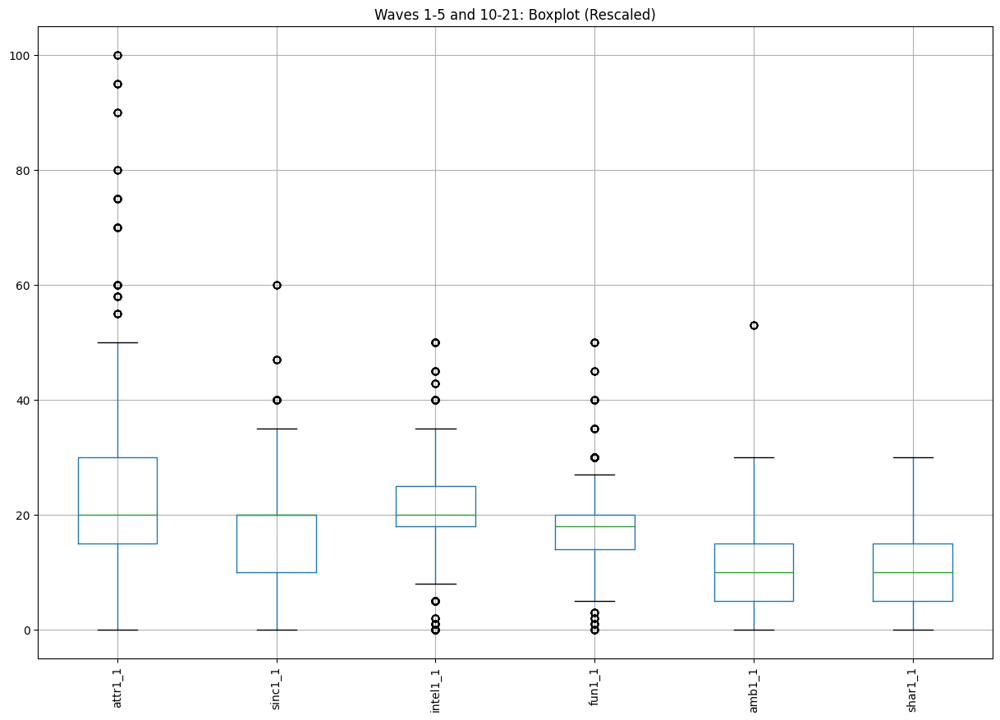

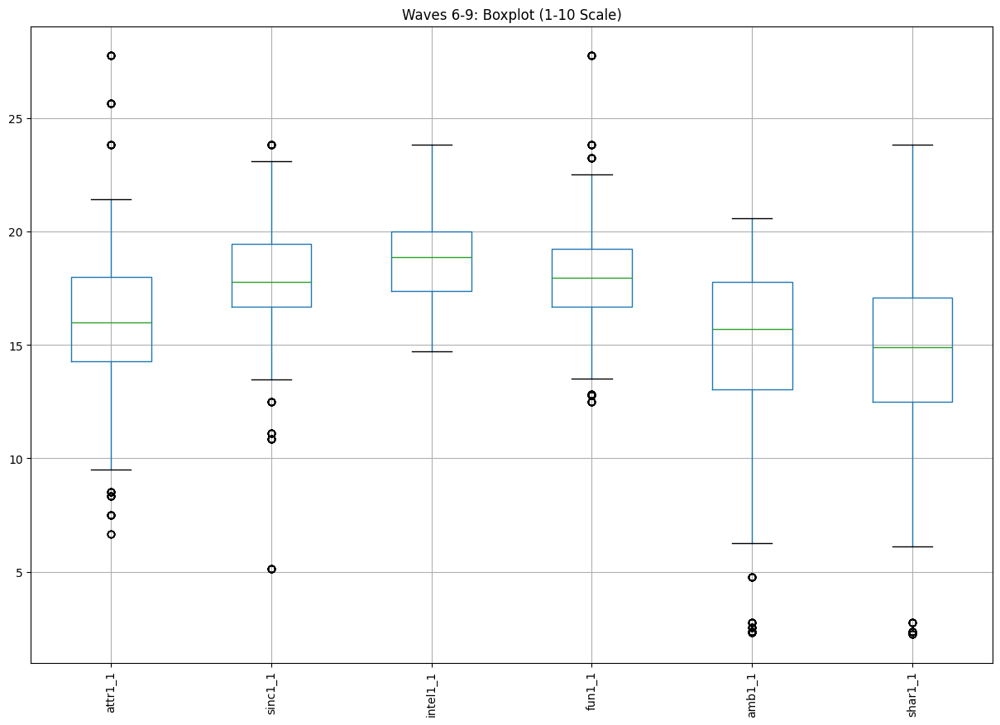

In [94]:
# Columns to rescale
columns_to_rescale = ['attr1_1', 'sinc1_1', 'intel1_1', 'fun1_1', 'amb1_1', 'shar1_1']

# Split the data into two separate DataFrames
df_wave_1_5_10_21 = df[df['wave'].isin([1, 2, 3, 4, 5, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21])]
df_wave_6_9 = df[df['wave'].isin([6, 7, 8, 9])]

# Perform analysis separately on the two DataFrames
# Example: boxplot for each set of waves
df_wave_1_5_10_21.boxplot(column=columns_to_rescale, figsize=(15, 10))
plt.xticks(rotation=90)
plt.title('Waves 1-5 and 10-21: Boxplot (Rescaled)')
plt.show()

df_wave_6_9.boxplot(column=columns_to_rescale, figsize=(15, 10))
plt.xticks(rotation=90)
plt.title('Waves 6-9: Boxplot (1-10 Scale)')
plt.show()

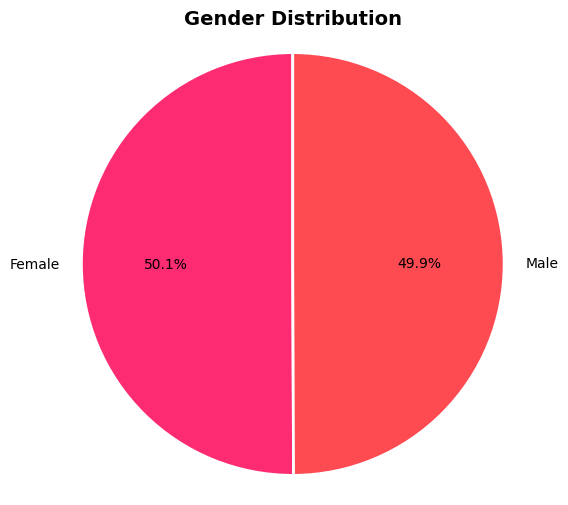

In [95]:
# Count the occurrences of each gender (assuming 0 = Female, 1 = Male)
gender_counts = df['gender'].value_counts()

# Define custom colors for Female and Male
colors = ['#FD2C72', '#FE4A51']  # Pink shades for Female and Male

# Create the pie chart
plt.figure(figsize=(6, 6))
plt.pie(gender_counts, labels=['Female', 'Male'], autopct='%1.1f%%', startangle=90, colors=colors, 
        wedgeprops={'edgecolor': 'white', 'linewidth': 2})

# Add a title and ensure the pie chart is circular
plt.title('Gender Distribution', fontsize=14, fontweight='bold')
plt.axis('equal')  # Ensure the pie chart is drawn as a circle

# Show the plot
plt.show()

In [96]:
# Créer une copie des colonnes pertinentes pour éviter de modifier la base de données
df_visualization = df[['age', 'gender']].copy()

# Regrouper les âges en tranches de 5 ans, de 18 à 55 ans (inclus)
df_visualization['age_group'] = pd.cut(df_visualization['age'], bins=[18, 23, 28, 33, 38, 43, 48, 56], right=False, labels=[
    '18-22', '23-27', '28-32', '33-37', '38-42', '43-47', '48-55'])

# Mapping des genres pour l'affichage, sans toucher à la base de données
gender_mapping = {
    0: 'Female',
    1: 'Male'
}

# Appliquer le mapping sur le DataFrame de visualisation seulement
df_visualization['gender_label'] = df_visualization['gender'].map(gender_mapping)

# Compter les occurrences de chaque groupe d'âge par genre
age_gender_counts = df_visualization.groupby(['age_group', 'gender_label'], observed=False).size().reset_index(name='Count')

# Calculer le pourcentage de chaque tranche d'âge pour chaque genre
age_gender_counts['Percentage'] = age_gender_counts.groupby('gender_label')['Count'].transform(lambda x: x / x.sum() * 100)

# Inverser les valeurs pour 'Female' pour qu'elles soient affichées à gauche
age_gender_counts.loc[age_gender_counts['gender_label'] == 'Female', 'Count'] *= -1

# Combiner le nombre et le pourcentage pour l'affichage des étiquettes
age_gender_counts['Label'] = age_gender_counts.apply(lambda row: f"{abs(row['Count'])} ({row['Percentage']:.1f}%)", axis=1)

# Couleurs personnalisées pour Female et Male
colors = ['#FD2C72', '#FE4A51']

# Créer la pyramide des âges (graphe en barres horizontales empilées)
fig = px.bar(age_gender_counts, x='Count', y='age_group', color='gender_label', orientation='h',
             title='Age Pyramid by Gender (5-Year Intervals)',
             labels={'age_group': 'Age Group', 'Count': 'Number of People', 'gender_label': 'Gender'},
             color_discrete_sequence=colors, text=age_gender_counts['Label'])  # Ajouter les étiquettes avec le nombre et le pourcentage

# Mettre à jour la mise en page : ajuster la taille, les polices et ajouter des étiquettes personnalisées
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Number of People',
    yaxis_title='Age Group',
    width=900,  # Augmenter la largeur
    height=600  # Ajuster la hauteur pour un meilleur espacement
)

# Afficher le graphique
fig.show()

In [97]:
# Valeur la plus petite (âge minimum)
age_min = df['age'].min()

# Valeur la plus grande (âge maximum)
age_max = df['age'].max()

# Afficher les résultats
print(f"L'âge minimum est : {age_min}")
print(f"L'âge maximum est : {age_max}")

L'âge minimum est : 18.0
L'âge maximum est : 55.0


In [98]:
# Mapping des numéros de race vers leurs descriptions respectives (seulement pour le graphique)
race_mapping = {
    1: 'Black/African American',
    2: 'European/Caucasian-American',
    3: 'Latino/Hispanic American',
    4: 'Asian/Pacific Islander/Asian-American',
    5: 'Native American',
    6: 'Other'
}

# Appliquer le mapping uniquement pour le graphique sans modifier la base de données
df['race_label'] = df['race'].map(race_mapping)

# Compter les occurrences de chaque catégorie de race
race_counts = df['race_label'].value_counts().reset_index()
race_counts.columns = ['Race', 'Count']  # Renommer les colonnes pour plus de clarté

# Couleurs personnalisées pour chaque catégorie de race (nuances de rose/rouge)
colors = ['#FD2C72', '#FE4A51', '#FF6A61', '#FF8A7B', '#FFA69B', '#FFC2BD']

# Créer le graphique en camembert (pie chart)
fig = px.pie(race_counts, names='Race', values='Count', title='Race Distribution',
             color='Race', color_discrete_sequence=colors)

# Mettre à jour la mise en page : ajuster la taille du graphique et la taille des polices
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    width=800,
    height=500
)

# Afficher le graphique
fig.show()

In [99]:
# Dictionnaire pour interpréter les options de la colonne 'goal'
goal_mapping = {
    1: 'Seemed like a fun night out',
    2: 'To meet new people',
    3: 'To get a date',
    4: 'Serious relationship',
    5: 'To say I did it',
    6: 'Other'
}

# Appliquer ce mapping uniquement pour la visualisation
df['goal_label'] = df['goal'].map(goal_mapping)

# Compter les occurrences de chaque option de goal par genre
goal_gender_counts = df.groupby(['goal_label', 'gender']).size().reset_index(name='Count')

# Trier les données du plus grand au plus petit nombre de participants
goal_gender_counts = goal_gender_counts.sort_values(by='Count', ascending=False)

# Custom colors for Female and Male
colors = ['#FD2C72', '#FE4A51']  # Rose pour Female, Rouge pour Male

# Créer l'histogramme stylisé avec barres côte à côte
fig = px.histogram(goal_gender_counts, x='goal_label', y='Count', color='gender',
                   title='Goal Distribution by Gender',
                   labels={'goal_label': 'Goal', 'Count': 'Number of People', 'gender': 'Gender (0=Female, 1=Male)'},
                   barmode='group',  # Barres côte à côte pour comparaison
                   color_discrete_sequence=colors)  # Couleurs personnalisées

# Mettre à jour la mise en page pour améliorer la lisibilité
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
     xaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe X
    yaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe Y
    xaxis_title_font_size=12,  # Taille plus petite pour le titre de l'axe X
    yaxis_title_font_size=12,  # Taille plus petite pour le titre de l'axe Y
    width=900,
    height=600
)

# Afficher le graphique
fig.show()

In [100]:
# Dictionnaire pour interpréter les options de la colonne 'date'
date_mapping = {
    1: 'Several times a week',
    2: 'Twice a week',
    3: 'Once a week',
    4: 'Twice a month',
    5: 'Once a month',
    6: 'Several times a year',
    7: 'Almost never'
}

# Appliquer ce mapping uniquement pour la visualisation
df['date_label'] = df['date'].map(date_mapping)

# Forcer l'ordre des catégories pour l'affichage dans le graphique
category_order = ['Several times a week', 'Twice a week', 'Once a week', 
                  'Twice a month', 'Once a month', 'Several times a year', 'Almost never']

# Compter les occurrences de chaque option de date par genre
date_gender_counts = df.groupby(['date_label', 'gender']).size().reset_index(name='Count')

# Custom colors for Female and Male
colors = ['#FD2C72', '#FE4A51']  # Rose pour Female, Rouge pour Male

# Créer l'histogramme stylisé avec barres côte à côte et ordre spécifique des catégories
fig = px.histogram(date_gender_counts, x='date_label', y='Count', color='gender',
                   category_orders={'date_label': category_order},  # Forcer l'ordre des catégories
                   title='Date Frequency Distribution by Gender',
                   labels={'date_label': 'Date Frequency', 'Count': 'Number of People', 'gender': 'Gender (0=Female, 1=Male)'},
                   barmode='group',  # Barres côte à côte pour comparaison
                   color_discrete_sequence=colors)  # Couleurs personnalisées

# Mettre à jour la mise en page pour améliorer la lisibilité
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe X
    yaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe Y
    xaxis_title_font_size=12,  # Taille plus petite pour le titre de l'axe X
    yaxis_title_font_size=12,  # Taille plus petite pour le titre de l'axe Y
    width=900,
    height=600
)

# Afficher le graphique
fig.show()

In [101]:
# Dictionnaire pour interpréter les options de la colonne 'go_out'
go_out_mapping = {
    1: 'Several times a week',
    2: 'Twice a week',
    3: 'Once a week',
    4: 'Twice a month',
    5: 'Once a month',
    6: 'Several times a year',
    7: 'Almost never'
}

# Appliquer ce mapping uniquement pour la visualisation
df['go_out_label'] = df['go_out'].map(go_out_mapping)

# Forcer l'ordre des catégories pour l'affichage dans le graphique
category_order_go_out = ['Several times a week', 'Twice a week', 'Once a week', 
                         'Twice a month', 'Once a month', 'Several times a year', 'Almost never']

# Compter les occurrences de chaque option de go_out par genre
go_out_gender_counts = df.groupby(['go_out_label', 'gender']).size().reset_index(name='Count')

# Custom colors for Female and Male
colors = ['#FD2C72', '#FE4A51']  # Rose pour Female, Rouge pour Male

# Créer l'histogramme stylisé avec barres côte à côte et ordre spécifique des catégories pour 'go_out'
fig = px.histogram(go_out_gender_counts, x='go_out_label', y='Count', color='gender',
                   category_orders={'go_out_label': category_order_go_out},  # Forcer l'ordre des catégories
                   title='Go Out Frequency Distribution by Gender',
                   labels={'go_out_label': 'Go Out Frequency', 'Count': 'Number of People', 'gender': 'Gender (0=Female, 1=Male)'},
                   barmode='group',  # Barres côte à côte pour comparaison
                   color_discrete_sequence=colors)  # Couleurs personnalisées

# Mettre à jour la mise en page pour améliorer la lisibilité
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe X
    yaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe Y
    xaxis_title_font_size=12,  # Taille plus petite pour le titre de l'axe X
    yaxis_title_font_size=12,  # Taille plus petite pour le titre de l'axe Y
    width=900,
    height=600
)

# Afficher le graphique
fig.show()

In [102]:
# Dictionnaire pour interpréter les options de la colonne 'career_c'
career_mapping = {
    1: 'Lawyer',
    2: 'Academic/Research',
    3: 'Psychologist',
    4: 'Doctor/Medicine',
    5: 'Engineer',
    6: 'Creative Arts/Entertainment',
    7: 'Banking/Consulting/Finance/CEO/etc',
    8: 'Real Estate',
    9: 'International/Humanitarian Affairs',
    10: 'Undecided',
    11: 'Social Work',
    12: 'Speech Pathology',
    13: 'Politics',
    14: 'Pro sports/Athletics',
    15: 'Other',
    16: 'Journalism',
    17: 'Architecture'
}

# Mapping des genres
gender_mapping = {
    0: 'Female',
    1: 'Male'
}

# Créer des colonnes temporaires pour le mapping sans écraser la base de données
df['career_label_temp'] = df['career_c'].map(career_mapping)
df['gender_label_temp'] = df['gender'].map(gender_mapping)

# Compter les occurrences de chaque catégorie de carrière par genre
career_gender_counts = df.groupby(['career_label_temp', 'gender_label_temp']).size().reset_index(name='Count')

# Calculer le nombre total par carrière pour trier du plus grand au plus petit
career_totals = career_gender_counts.groupby('career_label_temp')['Count'].sum().reset_index(name='Total')
career_gender_counts = pd.merge(career_gender_counts, career_totals, on='career_label_temp')

# Trier les carrières du plus grand au plus petit
career_gender_counts = career_gender_counts.sort_values(by='Total', ascending=False)

# Couleurs personnalisées pour les genres
colors = ['#FD2C72', '#FE4A51']

# Créer le graphique en barres groupées
fig = px.bar(career_gender_counts, x='career_label_temp', y='Count', color='gender_label_temp', barmode='group',
             title='Career Distribution by Gender',
             labels={'career_label_temp': 'Career', 'Count': 'Number of People', 'gender_label_temp': 'Gender'},
             color_discrete_sequence=colors)

# Mettre à jour la mise en page pour améliorer la lisibilité
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=10,  # Taille plus petite pour les labels de l'axe X
    yaxis_tickfont_size=12,  # Taille pour les labels de l'axe Y
    width=900,  # Augmenter la largeur pour une meilleure visibilité des labels
    height=600  # Ajuster la hauteur pour un espacement optimal
)

# Rotation des labels sur l'axe X pour une meilleure lisibilité
fig.update_xaxes(tickangle=-45)

# Afficher le graphique
fig.show()

In [103]:
# Liste des colonnes d'activités
activities = ['sports', 'tvsports', 'exercise', 'dining', 'museums', 'art', 'hiking', 'gaming', 
              'clubbing', 'reading', 'tv', 'theater', 'movies', 'concerts', 'music', 'shopping', 'yoga']

# Moyenne des réponses pour chaque activité par genre
activity_by_gender = df.groupby('gender')[activities].mean().reset_index()

# Créer des colonnes temporaires pour les labels de genre
activity_by_gender['gender_label'] = activity_by_gender['gender'].map({0: 'Female', 1: 'Male'})

# Transformer les données pour les adapter à un diagramme polaire (sans inclure gender comme activité)
activity_melted = pd.melt(activity_by_gender, id_vars='gender_label', value_vars=activities, 
                          var_name='Activity', value_name='Average Score')

# Couleurs personnalisées pour les genres
colors = ['#FD2C72', '#E4BC3C']  # Rose pour Female, Rouge pour Male

# Créer le graphique polaire combiné avec les deux genres
fig = px.line_polar(activity_melted, r='Average Score', theta='Activity', line_close=True, 
                    title='Activity Preferences by Gender', color='gender_label', color_discrete_sequence=colors)

# Mise à jour du layout pour un graphique plus grand, épaississement des lignes, et suppression des labels 'gender' dans les activités
fig.update_traces(line=dict(width=4))  # Épaissir les lignes

fig.update_layout(
    title_font_size=20,
    polar=dict(
        radialaxis=dict(visible=True, range=[0, 10])
    ),
    template='plotly_white',
    plot_bgcolor='#F0F2F4',  # Fond personnalisé
    paper_bgcolor='#F0F2F4',  # Fond du papier
    width=900,  # Augmenter la taille du graphique
    height=800,  # Augmenter la hauteur
    showlegend=True,  # Afficher la légende avec les couleurs de genre
    legend_title_text='Gender'  # Garder le titre de la légende
)

# Afficher le graphique
fig.show()

In [104]:
df_match_1 = df[df['match'] == 1]

# Vérifier les valeurs manquantes dans ce sous-ensemble
missing_values = df_match_1.isnull().sum()

# Afficher seulement les colonnes qui ont des valeurs manquantes
missing_values = missing_values[missing_values > 0]
print("Missing values for match=1:")
print(missing_values)

# Compter et afficher les valeurs de match avec les pourcentages
match_counts = df['match'].value_counts()
match_percentages = df['match'].value_counts(normalize=True) * 100

# Afficher les résultats
print("\nMatch counts:")
print(match_counts)
print("\nMatch percentages:")
print(match_percentages)

Missing values for match=1:
positin1             334
int_corr              30
age_o                 18
race_o                14
pf_o_att              15
                    ... 
race_label            14
goal_label            15
date_label            16
go_out_label          15
career_label_temp     22
Length: 185, dtype: int64

Match counts:
match
0    6998
1    1380
Name: count, dtype: int64

Match percentages:
match
0    83.528288
1    16.471712
Name: proportion, dtype: float64


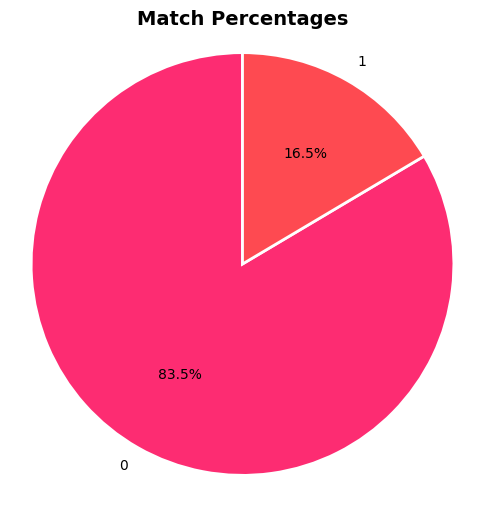

In [105]:
colors = ['#FD2C72', '#FE4A51']  # Couleurs personnalisées

plt.figure(figsize=(6, 6))
plt.pie(match_percentages, labels=match_percentages.index, autopct='%1.1f%%', startangle=90, colors=colors, wedgeprops={'edgecolor': 'white', 'linewidth': 2})
plt.title('Match Percentages', fontsize=14, fontweight='bold')
plt.axis('equal')  # Assurer que le camembert est dessiné comme un cercle.

plt.show()

In [106]:
# Créer des tranches d'âge de 5 ans comme décrit
bins = [18, 23, 28, 33, 38, 43, 48, 56]
labels = ['18-22', '23-27', '28-32', '33-37', '38-42', '43-47', '48-55']

# Créer une copie du DataFrame original
df_copy = df.copy()

df_copy['age_group'] = pd.cut(df_copy['age'], bins=bins, right=False, labels=labels)
df_copy['partner_age_group'] = pd.cut(df_copy['age_o'], bins=bins, right=False, labels=labels)

# Mapping des genres (ajout explicite pour la clarté dans les graphiques)
gender_mapping = {0: 'Female', 1: 'Male'}
df_copy['gender_label'] = df_copy['gender'].map(gender_mapping)
df_copy['partner_gender_label'] = df_copy['gender'].map(lambda x: 'Male' if x == 0 else 'Female')

# Fonction pour calculer les pourcentages de tranches d'âge rencontrées
def calculate_age_meeting_percentages(df):
    # Compter les occurrences des combinaisons de tranches d'âges rencontrées
    age_meeting_counts = df.groupby(['age_group', 'partner_age_group', 'gender_label', 'partner_gender_label']).size().reset_index(name='Count')
    
    # Calculer le pourcentage de chaque tranche d'âge rencontrée pour chaque tranche d'âge de l'individu
    age_meeting_counts['Percentage'] = age_meeting_counts.groupby(['age_group', 'gender_label'])['Count'].transform(lambda x: x / x.sum() * 100)
    
    return age_meeting_counts

# Calcul des pourcentages pour toutes les rencontres
age_meeting_percentages = calculate_age_meeting_percentages(df_copy)

# Calcul des pourcentages uniquement pour les rencontres ayant abouti à un match (match = 1)
age_meeting_percentages_match = calculate_age_meeting_percentages(df_copy[df_copy['match'] == 1])

# Fonction pour afficher les graphiques en barres empilées
def plot_stacked_bar(data, title):
    # Couleurs personnalisées pour 7 tranches d'âge
    colors = ['#FF6F61', '#FF9A8B', '#FFB3AB', '#FFCCB6', '#D6E5E5', '#A2D9CE', '#7FB3D5']
    
    fig = px.bar(data, x='age_group', y='Percentage', color='partner_age_group',
                 facet_col='gender_label',  # Ajouter des facettes par genre
                 labels={'age_group': 'Age Group', 'Percentage': 'Percentage of Encounters', 'partner_age_group': 'Partner Age Group'},
                 title=title, color_discrete_sequence=colors)

    # Mise à jour du layout
    fig.update_layout(
        title_font_size=18,
        title_x=0.5,
        xaxis_tickfont_size=12,
        yaxis_tickfont_size=12,
        xaxis_title='Age Group',
        yaxis_title='Percentage of Encounters',
        width=900,
        height=600,
        plot_bgcolor='#F0F2F4',  # Fond personnalisé
        paper_bgcolor='#F0F2F4'  # Fond du papier
    )
    
    fig.show()

# Afficher le graphique pour toutes les rencontres
plot_stacked_bar(age_meeting_percentages, "Age Group Encounters for All Dates")

# Afficher le graphique pour les matchs (match = 1)
plot_stacked_bar(age_meeting_percentages_match, "Age Group Encounters for Matches Only")

# Analyser les meilleures configurations pour provoquer un match
def analyze_best_age_match_configurations(df):
    # Calculer les pourcentages pour les matchs
    best_matches = df[df['match'] == 1].groupby(['age_group', 'partner_age_group']).size().reset_index(name='Count')
    best_matches['Percentage'] = best_matches.groupby('age_group')['Count'].transform(lambda x: x / x.sum() * 100)
    
    # Supprimer les lignes où la colonne Percentage est NaN
    best_matches = best_matches.dropna(subset=['Percentage'])
    
    # Trouver la combinaison ayant le plus grand pourcentage de match pour chaque tranche d'âge
    best_matches = best_matches.loc[best_matches.groupby('age_group')['Percentage'].idxmax()]
    
    return best_matches

# Afficher les meilleures configurations de match
best_age_match_configurations = analyze_best_age_match_configurations(df_copy)
print("Best Age Group Configurations for Matches:")
print(best_age_match_configurations)

/var/folders/dm/k1smy03547zg0plbdy1r1l380000gn/T/ipykernel_5380/2572034593.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/dm/k1smy03547zg0plbdy1r1l380000gn/T/ipykernel_5380/2572034593.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/dm/k1smy03547zg0plbdy1r1l380000gn/T/ipykernel_5380/2572034593.py:19: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/dm/k1smy03547zg0plbdy1r1l38

/var/folders/dm/k1smy03547zg0plbdy1r1l380000gn/T/ipykernel_5380/2572034593.py:67: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/dm/k1smy03547zg0plbdy1r1l380000gn/T/ipykernel_5380/2572034593.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/dm/k1smy03547zg0plbdy1r1l380000gn/T/ipykernel_5380/2572034593.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



ValueError: Can't get idxmax of an empty group due to unobserved categories. Specify observed=True in groupby instead.

In [53]:
# Sample DataFrame creation (assuming df is your original DataFrame)
# df = pd.read_csv('your_data.csv')  # Replace with actual loading code

# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['attr1_1', 'attr1_s', 'attr1_2', 'attr1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'attr1_1': 'Sign Up',
    'attr1_s': 'Halfway',
    'attr1_2': 'Follow-up Time2',
    'attr1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 202)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    15.0     attr1  Sign Up
1       Female    15.0     attr1  Sign Up
2       Female    15.0     attr1  Sign Up
3       Female    15.0     attr1  Sign Up
4       Female    15.0     attr1  Sign Up


In [55]:
# Sample DataFrame creation (assuming df is your original DataFrame)
# df = pd.read_csv('your_data.csv')  # Replace with actual loading code

# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['sinc1_1', 'sinc1_s', 'sinc1_2', 'sinc1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'sinc1_1': 'Sign Up',
    'sinc1_s': 'Halfway',
    'sinc1_2': 'Follow-up Time2',
    'sinc1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 202)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    20.0     sinc1  Sign Up
1       Female    20.0     sinc1  Sign Up
2       Female    20.0     sinc1  Sign Up
3       Female    20.0     sinc1  Sign Up
4       Female    20.0     sinc1  Sign Up


In [57]:
# Sample DataFrame creation (assuming df is your original DataFrame)
# df = pd.read_csv('your_data.csv')  # Replace with actual loading code

# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['intel1_1', 'intel1_s', 'intel1_2', 'intel1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'intel1_1': 'Sign Up',
    'intel1_s': 'Halfway',
    'intel1_2': 'Follow-up Time2',
    'intel1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 202)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    20.0    intel1  Sign Up
1       Female    20.0    intel1  Sign Up
2       Female    20.0    intel1  Sign Up
3       Female    20.0    intel1  Sign Up
4       Female    20.0    intel1  Sign Up


In [59]:
# Sample DataFrame creation (assuming df is your original DataFrame)
# df = pd.read_csv('your_data.csv')  # Replace with actual loading code

# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['fun1_1', 'fun1_s', 'fun1_2', 'fun1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'fun1_1': 'Sign Up',
    'fun1_s': 'Halfway',
    'fun1_2': 'Follow-up Time2',
    'fun1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 202)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    15.0      fun1  Sign Up
1       Female    15.0      fun1  Sign Up
2       Female    15.0      fun1  Sign Up
3       Female    15.0      fun1  Sign Up
4       Female    15.0      fun1  Sign Up


In [60]:
# Sample DataFrame creation (assuming df is your original DataFrame)
# df = pd.read_csv('your_data.csv')  # Replace with actual loading code

# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['amb1_1', 'amb1_s', 'amb1_2', 'amb1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'amb1_1': 'Sign Up',
    'amb1_s': 'Halfway',
    'amb1_2': 'Follow-up Time2',
    'amb1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 202)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    15.0      amb1  Sign Up
1       Female    15.0      amb1  Sign Up
2       Female    15.0      amb1  Sign Up
3       Female    15.0      amb1  Sign Up
4       Female    15.0      amb1  Sign Up


In [61]:
# Sample DataFrame creation (assuming df is your original DataFrame)
# df = pd.read_csv('your_data.csv')  # Replace with actual loading code

# Step 1: Filter the data for the specific attributes across phases
attribute_cols = ['shar1_1', 'shar1_s', 'shar1_2', 'shar1_3']
df_filtered = df[['gender_label'] + attribute_cols]

# Print the shape of the original and filtered DataFrame
print("Original DataFrame Shape:", df.shape)
print("Filtered DataFrame Shape:", df_filtered.shape)

# Step 2: Melt the data to long format
melted_df = df_filtered.melt(id_vars=['gender_label'], 
                             value_vars=attribute_cols, 
                             var_name='attribute_phase', 
                             value_name='rating')

# Print the shape of the melted DataFrame
print("DataFrame Shape After Melt:", melted_df.shape)

# Step 3: Extract phase and attribute information from the 'attribute_phase' column
melted_df['attribute'] = melted_df['attribute_phase'].str.split('_').str[0]
melted_df['phase'] = melted_df['attribute_phase'].str.split('_').str[1]

# Define phase names for better readability
phase_mapping = {
    'shar1_1': 'Sign Up',
    'shar1_s': 'Halfway',
    'shar1_2': 'Follow-up Time2',
    'shar1_3': 'Follow-up2 Time3'
}

# Map phases to the readable names
melted_df['phase'] = melted_df['attribute_phase'].map(phase_mapping)

# Drop 'attribute_phase' column if no longer needed
melted_df.drop(columns='attribute_phase', inplace=True)

# Print the first few rows to verify
print(melted_df.head())

# Plot the data
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label', facet_col='phase',
             labels={'attribute': 'Attribute', 'rating': 'Rating'},
             title="Distribution of Ratings by Attribute, Phase, and Gender")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

Original DataFrame Shape: (8378, 202)
Filtered DataFrame Shape: (8378, 5)
DataFrame Shape After Melt: (33512, 3)
  gender_label  rating attribute    phase
0       Female    15.0     shar1  Sign Up
1       Female    15.0     shar1  Sign Up
2       Female    15.0     shar1  Sign Up
3       Female    15.0     shar1  Sign Up
4       Female    15.0     shar1  Sign Up


In [116]:
# Remplacer les NaNs par la médiane dans les colonnes d'attributs
attributes = ['attr7_2', 'sinc7_2', 'intel7_2', 'fun7_2', 'amb7_2', 'shar7_2']
df[attributes] = df[attributes].fillna(df[attributes].median())

# Filtrer les données pour match = 1
df_filtered = df[df['match'] == 1]

# Créer un DataFrame fondu
melted_df = df_filtered.melt(id_vars=['gender'], 
                             value_vars=attributes, 
                             var_name='attribute', 
                             value_name='rating')

# Convertir les valeurs du genre pour l'affichage
melted_df['gender'] = melted_df['gender'].map({0: 'Female', 1: 'Male'})

# Créer le graphique
fig = px.box(melted_df, x='attribute', y='rating', color='gender',
             labels={'attribute': 'Attribute', 'rating': 'Rating', 'gender': 'Gender'},
             title="Distribution of Attributes by Gender")

# Afficher le graphique
fig.show()

In [125]:
# Suppose df_copy is your DataFrame
# Filter the DataFrame for goal_label == 'Seemed like a fun night out'
filtered_df = df_copy[df_copy['goal_label'] == 'Seemed like a fun night out']

# Define the columns for the attributes you want to analyze
attribute_cols = ['attr7_2', 'sinc7_2', 'intel7_2', 'fun7_2', 'amb7_2', 'shar7_2']

# Melt the filtered DataFrame to long format
melted_df = filtered_df.melt(id_vars=['gender'], value_vars=attribute_cols, 
                             var_name='attribute', value_name='rating')

# Convert 'gender' to 'gender_label'
melted_df['gender_label'] = melted_df['gender'].map({0: 'Female', 1: 'Male'})

# Create the box plot using Plotly Express
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label',
             labels={'attribute': 'Attribute', 'rating': 'Rating', 'gender_label': 'Gender'},
             title="Distribution of Ratings by Attribute and Gender for Goal: 'Seemed like a fun night out'")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    boxmode='group',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

In [126]:
# Filter the DataFrame for goal_label == 'To meet new people'
filtered_df = df_copy[df_copy['goal_label'] == 'To meet new people']

# Define the columns for the attributes you want to analyze
attribute_cols = ['attr7_2', 'sinc7_2', 'intel7_2', 'fun7_2', 'amb7_2', 'shar7_2']

# Melt the filtered DataFrame to long format
melted_df = filtered_df.melt(id_vars=['gender'], value_vars=attribute_cols, 
                             var_name='attribute', value_name='rating')

# Convert 'gender' to 'gender_label'
melted_df['gender_label'] = melted_df['gender'].map({0: 'Female', 1: 'Male'})

# Create the box plot using Plotly Express
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label',
             labels={'attribute': 'Attribute', 'rating': 'Rating', 'gender_label': 'Gender'},
             title="Distribution of Ratings by Attribute and Gender for Goal: 'To meet new people'")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    boxmode='group',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

In [127]:
# Filter the DataFrame for goal_label == 'Serious relationship'
filtered_df = df_copy[df_copy['goal_label'] == 'Serious relationship']

# Define the columns for the attributes you want to analyze
attribute_cols = ['attr7_2', 'sinc7_2', 'intel7_2', 'fun7_2', 'amb7_2', 'shar7_2']

# Melt the filtered DataFrame to long format
melted_df = filtered_df.melt(id_vars=['gender'], value_vars=attribute_cols, 
                             var_name='attribute', value_name='rating')

# Convert 'gender' to 'gender_label'
melted_df['gender_label'] = melted_df['gender'].map({0: 'Female', 1: 'Male'})

# Create the box plot using Plotly Express
fig = px.box(melted_df, x='attribute', y='rating', color='gender_label',
             labels={'attribute': 'Attribute', 'rating': 'Rating', 'gender_label': 'Gender'},
             title="Distribution of Ratings by Attribute and Gender for Goal: 'Serious relationship'")

# Update layout for better appearance
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_title='Attribute',
    yaxis_title='Rating',
    boxmode='group',
    paper_bgcolor='#F0F2F4'
)

# Show the plot
fig.show()

In [129]:
# Step 1: Filter the DataFrame
filtered_df = df_copy[(df_copy['match'] == 1) & (df_copy['gender'] == 0)]

# Step 2: Select the relevant columns
columns_of_interest = [
    'attr', 'sinc', 'intel', 'fun', 'amb', 'shar',
    'attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o', 'shar_o'
]
filtered_df = filtered_df[columns_of_interest]

# Step 3: Compute the correlation matrix
correlation_matrix = filtered_df.corr()

# Step 4: Plot the correlation matrix using Plotly
fig = px.imshow(correlation_matrix, 
                title="Correlation Table of Attributes if match = 1 - Female",
                labels=dict(color="Correlation"),
                color_continuous_scale='RdBu_r')

# Show the plot
fig.show()

In [158]:
# Prepare the data
df_filtered['gender_label'] = df_filtered['gender'].map({0: 'Female', 1: 'Male'})
like_o_summary = df_filtered.groupby('gender_label')['like_o'].sum().reset_index()
dec_o_summary = df_filtered.groupby('gender_label')['dec_o'].sum().reset_index()

# Create the bar plots
fig = go.Figure()

# Add bars for like_o
fig.add_trace(go.Bar(
    x=like_o_summary['gender_label'],
    y=like_o_summary['like_o'],
    name='Like_o',
    marker_color='#FD2C72',  # Color for Female
    text=like_o_summary['like_o'],  # Values to display on bars
    textposition='outside'  # Position of the text
))

# Add bars for dec_o
fig.add_trace(go.Bar(
    x=dec_o_summary['gender_label'],
    y=dec_o_summary['dec_o'],
    name='Dec_o',
    marker_color='#FE4A51',  # Color for Male
    text=dec_o_summary['dec_o'],  # Values to display on bars
    textposition='outside'  # Position of the text
))

# Update layout
fig.update_layout(
    barmode='group',
    title='Comparison of Like_o and Dec_o by Gender',
    xaxis_title='Gender',
    yaxis_title='Count',
    height=600,  # Increase the height of the graph
)

# Display the plot
fig.show()

In [174]:
# Créer une nouvelle copie des données originales pour travailler dessus
df_cleaned = df.copy()

# Remplacer les valeurs manquantes par 0 sans utiliser inplace=True
df_cleaned['like_o'] = df_cleaned['like_o'].fillna(0)
df_cleaned['dec_o'] = df_cleaned['dec_o'].fillna(0)

# Vérifier les valeurs min et max dans le nouveau DataFrame
print("Valeur min et max pour like_o dans df_cleaned :", df_cleaned['like_o'].min(), df_cleaned['like_o'].max())
print("Valeur min et max pour dec_o dans df_cleaned :", df_cleaned['dec_o'].min(), df_cleaned['dec_o'].max())

Valeur min et max pour like_o dans df_cleaned : 0.0 10.0
Valeur min et max pour dec_o dans df_cleaned : 0 1


In [175]:
# Vérifier les types de colonnes dans le DataFrame original
print(df.dtypes)

# Vérifier les valeurs uniques dans la colonne dec_o
print(df['dec_o'].unique())

iid                    int64
id                   float64
gender                 int64
idg                    int64
condtn                 int64
                      ...   
date_label            object
go_out_label          object
career_label_temp     object
gender_label_temp     object
gender_label          object
Length: 202, dtype: object
[0 1]


In [176]:
# Créer une nouvelle version nettoyée des données
df_cleaned = df.copy()
df_cleaned['like_o'] = df_cleaned['like_o'].fillna(0)
df_cleaned['dec_o'] = df_cleaned['dec_o'].fillna(0)

# Créer des labels pour le genre sans modifier la base originale
df_cleaned['gender_label'] = df_cleaned['gender'].map({0: 'Female', 1: 'Male'})

# Calculer la somme pour like_o et dec_o par genre après remplacement des valeurs manquantes
like_o_summary = df_cleaned.groupby('gender_label')['like_o'].sum().reset_index()
dec_o_summary = df_cleaned.groupby('gender_label')['dec_o'].sum().reset_index()

# Créer des labels distincts pour chaque genre et attribut
categories = ['Like_o Female', 'Like_o Male', 'Dec_o Female', 'Dec_o Male']
values = [
    like_o_summary.loc[like_o_summary['gender_label'] == 'Female', 'like_o'].values[0],
    like_o_summary.loc[like_o_summary['gender_label'] == 'Male', 'like_o'].values[0],
    dec_o_summary.loc[dec_o_summary['gender_label'] == 'Female', 'dec_o'].values[0],
    dec_o_summary.loc[dec_o_summary['gender_label'] == 'Male', 'dec_o'].values[0]
]

# Créer une figure
fig = go.Figure()

# Ajouter les barres pour chaque catégorie
fig.add_trace(go.Bar(
    x=categories,
    y=values,
    marker_color=['#FD2C72', '#FE4A51', '#FD2C72', '#FE4A51'],  # Couleurs pour Female et Male
    text=values,  # Afficher les sommes sur les barres
    textposition='outside'  # Position du texte sur les barres
))

# Mettre à jour la mise en page
fig.update_layout(
    barmode='group',
    title='Somme des Like_o et Dec_o par Genre (Valeurs manquantes remplacées par 0)',
    xaxis_title='Attributs',
    yaxis_title='Somme',
    height=600  # Augmenter la hauteur du graphique
)

# Afficher le graphique
fig.show()

# Comparer avec un pivot_table pour vérifier les résultats
pivot = pd.pivot_table(df_cleaned, values=['like_o', 'dec_o'], index='gender', aggfunc='sum').reset_index()
print(pivot)

   gender  dec_o   like_o
0       0   1986  25600.2
1       1   1529  24261.0


In [4]:
# Liste des colonnes d'attributs
attributes = ['attr', 'sinc', 'intel', 'fun', 'amb', 'shar']

# Moyenne des réponses pour chaque attribut par genre
attributes_by_gender = df.groupby('gender')[attributes].mean().reset_index()

# Créer des colonnes temporaires pour les labels de genre
attributes_by_gender['gender_label'] = attributes_by_gender['gender'].map({0: 'Female', 1: 'Male'})

# Transformer les données pour les adapter à un diagramme polaire
attributes_melted = pd.melt(attributes_by_gender, id_vars='gender_label', value_vars=attributes, 
                            var_name='Attribute', value_name='Average Score')

# Couleurs personnalisées pour les genres (Rose pour Female, Rouge pour Male)
colors = ['#FD2C72', '#E4BC3C'] 

# Créer le graphique polaire combiné avec les deux genres
fig = px.line_polar(attributes_melted, r='Average Score', theta='Attribute', line_close=True, 
                    title='Attribute Ratings by Gender', color='gender_label', color_discrete_sequence=colors)

# Mise à jour du layout pour un graphique plus grand, épaississement des lignes
fig.update_traces(line=dict(width=4))

fig.update_layout(
    title_font_size=20,
    polar=dict(
        radialaxis=dict(visible=True, range=[0, 10])  # Ajustez la plage en fonction des scores possibles
    ),
    template='plotly_white',
    plot_bgcolor='#F0F2F4',  # Fond personnalisé
    paper_bgcolor='#F0F2F4',  # Fond du papier
    width=900,  # Augmenter la taille du graphique
    height=800,  # Augmenter la hauteur
    showlegend=True,  # Afficher la légende
    legend_title_text='Gender'  # Titre de la légende
)

# Afficher le graphique
fig.show()

In [5]:
# Liste des colonnes d'attributs
attributes = ['attr', 'sinc', 'intel', 'fun', 'amb', 'shar']

# Médiane des réponses pour chaque attribut par genre
attributes_by_gender = df.groupby('gender')[attributes].median().reset_index()

# Créer des colonnes temporaires pour les labels de genre
attributes_by_gender['gender_label'] = attributes_by_gender['gender'].map({0: 'Female', 1: 'Male'})

# Transformer les données pour les adapter à un diagramme polaire
attributes_melted = pd.melt(attributes_by_gender, id_vars='gender_label', value_vars=attributes, 
                            var_name='Attribute', value_name='Median Score')

# Couleurs personnalisées pour les genres (Rose pour Female, Jaune pour Male)
colors = ['#FD2C72', '#E4BC3C'] 

# Créer le graphique polaire combiné avec les deux genres
fig = px.line_polar(attributes_melted, r='Median Score', theta='Attribute', line_close=True, 
                    title='Median Attribute Ratings by Gender - Scorecard', color='gender_label', color_discrete_sequence=colors)

# Mise à jour du layout pour un graphique plus grand, épaississement des lignes
fig.update_traces(line=dict(width=4))

fig.update_layout(
    title_font_size=20,
    polar=dict(
        radialaxis=dict(visible=True, range=[0, 10])  # Ajustez la plage en fonction des scores possibles
    ),
    template='plotly_white',
    plot_bgcolor='#F0F2F4',  # Fond personnalisé
    paper_bgcolor='#F0F2F4',  # Fond du papier
    width=900,  # Augmenter la taille du graphique
    height=800,  # Augmenter la hauteur
    showlegend=True,  # Afficher la légende
    legend_title_text='Gender'  # Titre de la légende
)

# Afficher le graphique
fig.show()

In [7]:
# Liste des colonnes d'attributs pour la phase avec filtre dec = 1
attributes_filtered = ['attr1_2', 'sinc1_2', 'intel1_2', 'fun1_2', 'amb1_2', 'shar1_2']

# Filtrer les données pour dec = 1
df_filtered_5 = df[df['dec'] == 1].copy()

# Médiane des réponses pour chaque attribut par genre après filtrage
attributes_by_gender_filtered_5 = df_filtered_5.groupby('gender')[attributes_filtered].median().reset_index()

# Créer des colonnes temporaires pour les labels de genre
attributes_by_gender_filtered_5['gender_label'] = attributes_by_gender_filtered_5['gender'].map({0: 'Female', 1: 'Male'})

# Transformer les données pour les adapter à un diagramme polaire
attributes_melted_filtered_5 = pd.melt(attributes_by_gender_filtered_5, id_vars='gender_label', value_vars=attributes_filtered, 
                                       var_name='Attribute', value_name='Median Score')

# Couleurs personnalisées pour les genres
colors = ['#FD2C72', '#E4BC3C']  # Rose pour Female, Jaune pour Male

# Créer le graphique polaire combiné avec les deux genres après filtrage
fig_filtered_5 = px.line_polar(attributes_melted_filtered_5, r='Median Score', theta='Attribute', line_close=True, 
                               title='Median Attribute Ratings (dec = 1) by Gender', color='gender_label', 
                               color_discrete_sequence=colors)

# Mise à jour du layout pour un graphique plus grand, épaississement des lignes
fig_filtered_5.update_traces(line=dict(width=4))

fig_filtered_5.update_layout(
    title_font_size=20,
    polar=dict(
        radialaxis=dict(visible=True, range=[0, 10])  # Ajustez la plage en fonction des scores possibles
    ),
    template='plotly_white',
    plot_bgcolor='#F0F2F4',  # Fond personnalisé
    paper_bgcolor='#F0F2F4',  # Fond du papier
    width=900,  # Augmenter la taille du graphique
    height=800,  # Augmenter la hauteur
    showlegend=True,  # Afficher la légende
    legend_title_text='Gender'  # Titre de la légende
)

# Afficher le graphique
fig_filtered_5.show()

In [8]:
# Liste des attributs pour la première ligne (toute la base)
attributes_all = ['attr', 'sinc', 'intel', 'fun', 'amb', 'shar']

# Liste des attributs pour la deuxième ligne avec le filtre dec == 1
attributes_filtered = ['attr1_2', 'sinc1_2', 'intel1_2', 'fun1_2', 'amb1_2', 'shar1_2']

# Filtrer les données pour dec = 1
df_filtered_5 = df[df['dec'] == 1].copy()

# Première ligne: toute la base, scatter plot splitté par genre
df_melted_all = pd.melt(df, id_vars='gender', value_vars=attributes_all, 
                        var_name='Attribute', value_name='Score')

# Deuxième ligne: filtré par dec == 1, scatter plot splitté par genre
df_melted_filtered_5 = pd.melt(df_filtered_5, id_vars='gender', value_vars=attributes_filtered, 
                               var_name='Attribute', value_name='Score')

# Créer une colonne temporaire pour les labels de genre
df_melted_all['gender_label'] = df_melted_all['gender'].map({0: 'Female', 1: 'Male'})
df_melted_filtered_5['gender_label'] = df_melted_filtered_5['gender'].map({0: 'Female', 1: 'Male'})

# Scatter plot pour la première ligne (toute la base)
fig_all = px.scatter(df_melted_all, x='Attribute', y='Score', color='gender_label', 
                     facet_col='gender_label', title='Attributes (All Data)', 
                     color_discrete_sequence=['#FD2C72', '#E4BC3C'])

# Scatter plot pour la deuxième ligne (données filtrées dec == 1)
fig_filtered_5 = px.scatter(df_melted_filtered_5, x='Attribute', y='Score', color='gender_label', 
                            facet_col='gender_label', title='Attributes (Filtered dec = 1)', 
                            color_discrete_sequence=['#FD2C72', '#E4BC3C'])

# Ajustement du layout pour fusionner les deux figures (sous-plots)
fig_all.update_layout(height=400, showlegend=False)
fig_filtered_5.update_layout(height=400, showlegend=False)

# Fusionner les deux figures dans un seul layout
from plotly.subplots import make_subplots
from plotly.graph_objs import Scatter

# Créer la grille avec 2 lignes et 2 colonnes
fig_combined = make_subplots(rows=2, cols=2, subplot_titles=['Female (All)', 'Male (All)', 
                                                             'Female (dec=1)', 'Male (dec=1)'])

# Ajouter les scatter plots pour toute la base
fig_combined.add_trace(fig_all.data[0], row=1, col=1)  # Female (All)
fig_combined.add_trace(fig_all.data[1], row=1, col=2)  # Male (All)

# Ajouter les scatter plots pour les données filtrées
fig_combined.add_trace(fig_filtered_5.data[0], row=2, col=1)  # Female (dec=1)
fig_combined.add_trace(fig_filtered_5.data[1], row=2, col=2)  # Male (dec=1)

# Mise à jour du layout global
fig_combined.update_layout(height=800, width=900, title_text="Scatter Plot of Attributes by Gender")

# Afficher la figure combinée
fig_combined.show()

In [11]:
# Liste des colonnes d'attributs à analyser
attributes = ['attr', 'sinc', 'intel', 'fun', 'amb', 'shar']

# Filtrer les données pour dec == 0
df_visualization = df[df['dec'] == 0][['gender'] + attributes].copy()

# Mapping des genres pour l'affichage
gender_mapping = {
    0: 'Female',
    1: 'Male'
}

# Appliquer le mapping sur le DataFrame de visualisation
df_visualization['gender_label'] = df_visualization['gender'].map(gender_mapping)

# Transformation des données pour obtenir les sommes des scores de chaque attribut par genre
df_melted = pd.melt(df_visualization, id_vars=['gender_label'], value_vars=attributes, 
                    var_name='Attribute', value_name='Score')

# Somme des scores pour chaque attribut par genre
attribute_gender_sums = df_melted.groupby(['Attribute', 'gender_label'], observed=False)['Score'].sum().reset_index()

# Calculer le pourcentage pour chaque attribut par genre
attribute_gender_sums['Percentage'] = attribute_gender_sums.groupby('gender_label')['Score'].transform(lambda x: x / x.sum() * 100)

# Inverser les valeurs pour 'Female' pour qu'elles soient affichées à gauche
attribute_gender_sums.loc[attribute_gender_sums['gender_label'] == 'Female', 'Score'] *= -1

# Combiner la somme et le pourcentage pour l'affichage des étiquettes
attribute_gender_sums['Label'] = attribute_gender_sums.apply(lambda row: f"{abs(row['Score']):.1f} ({row['Percentage']:.1f}%)", axis=1)

# Trier les attributs du plus grand au plus petit en fonction de la somme totale des scores (sans tenir compte du genre)
attribute_gender_sums['Total_Score'] = attribute_gender_sums['Score'].abs()
attribute_gender_sums = attribute_gender_sums.sort_values(by='Total_Score', ascending=False)

# Couleurs personnalisées pour Female et Male
colors = ['#FD2C72', '#FE4A51']

# Créer la pyramide des attributs (graphe en barres horizontales empilées)
fig = px.bar(attribute_gender_sums, x='Score', y='Attribute', color='gender_label', orientation='h',
             title='Attribute Pyramid by Gender (Sum of Scores, Sorted)',
             labels={'Attribute': 'Attribute', 'Score': 'Sum of Scores', 'gender_label': 'Gender'},
             color_discrete_sequence=colors, text=attribute_gender_sums['Label'])  # Ajouter les étiquettes avec le score et le pourcentage

# Mettre à jour la mise en page : ajuster la taille, les polices et ajouter des étiquettes personnalisées
fig.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Sum of Scores',
    yaxis_title='Attribute',
    width=900,  # Augmenter la largeur
    height=600  # Ajuster la hauteur pour un meilleur espacement
)

# Afficher le graphique
fig.show()

In [14]:
# Liste des attributs de perception de soi et ceux notés par le/la partenaire
self_attributes = ['attr5_1', 'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1']
partner_attributes = ['attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o']

# Filtrer les données pour les femmes (gender == 0)
df_women = df[df['gender'] == 0][self_attributes + partner_attributes].copy()
df_women['Self/Partner'] = 'Self'

# Créer un DataFrame pour les attributs notés par les partenaires
df_women_partner = df[df['gender'] == 0][partner_attributes].copy()
df_women_partner.columns = self_attributes  # Renommer les colonnes pour les aligner avec celles de perception de soi
df_women_partner['Self/Partner'] = 'Partner'

# Combiner les deux DataFrames pour les femmes
df_women_combined = pd.concat([df_women[self_attributes + ['Self/Partner']], df_women_partner[self_attributes + ['Self/Partner']]])

# Transformation des données pour un format long (nécessaire pour les pyramides)
df_women_melted = pd.melt(df_women_combined, id_vars=['Self/Partner'], value_vars=self_attributes, 
                          var_name='Attribute', value_name='Score')

# Filtrer les données pour les hommes (gender == 1)
df_men = df[df['gender'] == 1][self_attributes + partner_attributes].copy()
df_men['Self/Partner'] = 'Self'

# Créer un DataFrame pour les attributs notés par les partenaires
df_men_partner = df[df['gender'] == 1][partner_attributes].copy()
df_men_partner.columns = self_attributes  # Renommer les colonnes pour les aligner avec celles de perception de soi
df_men_partner['Self/Partner'] = 'Partner'

# Combiner les deux DataFrames pour les hommes
df_men_combined = pd.concat([df_men[self_attributes + ['Self/Partner']], df_men_partner[self_attributes + ['Self/Partner']]])

# Transformation des données pour un format long (nécessaire pour les pyramides)
df_men_melted = pd.melt(df_men_combined, id_vars=['Self/Partner'], value_vars=self_attributes, 
                        var_name='Attribute', value_name='Score')

# Couleurs personnalisées pour Self et Partner
colors = ['#FD2C72', '#FE4A51']

# Créer les pyramides pour les femmes
fig_women = px.bar(df_women_melted, x='Score', y='Attribute', color='Self/Partner', orientation='h',
                   title="Self vs Partner Ratings for Women",
                   labels={'Attribute': 'Attribute', 'Score': 'Score', 'Self/Partner': 'Self vs Partner'},
                   color_discrete_sequence=colors, facet_col='Self/Partner', text='Score')

# Créer les pyramides pour les hommes
fig_men = px.bar(df_men_melted, x='Score', y='Attribute', color='Self/Partner', orientation='h',
                 title="Self vs Partner Ratings for Men",
                 labels={'Attribute': 'Attribute', 'Score': 'Score', 'Self/Partner': 'Self vs Partner'},
                 color_discrete_sequence=colors, facet_col='Self/Partner', text='Score')

# Mettre à jour les layouts pour les deux figures
fig_women.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Score',
    yaxis_title='Attribute',
    width=900,
    height=600
)

fig_men.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Score',
    yaxis_title='Attribute',
    width=900,
    height=600
)

# Afficher les deux figures
fig_women.show()
fig_men.show()

In [16]:
# Liste des attributs de perception de soi et ceux notés par le/la partenaire
self_attributes = ['attr5_1', 'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1']
partner_attributes = ['attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o']

# Filtrer les données pour les femmes (gender == 0)
df_women = df[df['gender'] == 0][self_attributes + partner_attributes].copy()

# Calculer la médiane pour les femmes
df_women_median_self = df_women[self_attributes].median().reset_index()
df_women_median_self.columns = ['Attribute', 'Median_Score']
df_women_median_self['Self/Partner'] = 'Self'

df_women_median_partner = df_women[partner_attributes].median().reset_index()
df_women_median_partner.columns = ['Attribute', 'Median_Score']
df_women_median_partner['Self/Partner'] = 'Partner'

# Combiner les données de perception de soi et de la note du partenaire pour les femmes
df_women_combined = pd.concat([df_women_median_self, df_women_median_partner])

# Filtrer les données pour les hommes (gender == 1)
df_men = df[df['gender'] == 1][self_attributes + partner_attributes].copy()

# Calculer la médiane pour les hommes
df_men_median_self = df_men[self_attributes].median().reset_index()
df_men_median_self.columns = ['Attribute', 'Median_Score']
df_men_median_self['Self/Partner'] = 'Self'

df_men_median_partner = df_men[partner_attributes].median().reset_index()
df_men_median_partner.columns = ['Attribute', 'Median_Score']
df_men_median_partner['Self/Partner'] = 'Partner'

# Combiner les données de perception de soi et de la note du partenaire pour les hommes
df_men_combined = pd.concat([df_men_median_self, df_men_median_partner])

# Couleurs personnalisées pour Self et Partner
colors = ['#FD2C72', '#FE4A51']

# Créer la pyramide pour les femmes
fig_women = px.bar(df_women_combined, x='Median_Score', y='Attribute', color='Self/Partner', orientation='h',
                   title="Median Self vs Partner Ratings for Women",
                   labels={'Attribute': 'Attribute', 'Median_Score': 'Median Score', 'Self/Partner': 'Self vs Partner'},
                   color_discrete_sequence=colors, text='Median_Score')

# Créer la pyramide pour les hommes
fig_men = px.bar(df_men_combined, x='Median_Score', y='Attribute', color='Self/Partner', orientation='h',
                 title="Median Self vs Partner Ratings for Men",
                 labels={'Attribute': 'Attribute', 'Median_Score': 'Median Score', 'Self/Partner': 'Self vs Partner'},
                 color_discrete_sequence=colors, text='Median_Score')

# Mettre à jour les layouts pour les deux figures
fig_women.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Median Score',
    yaxis_title='Attribute',
    width=900,
    height=600
)

fig_men.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Median Score',
    yaxis_title='Attribute',
    width=900,
    height=600
)

# Afficher les deux figures
fig_women.show()
fig_men.show()

In [17]:
# Liste des attributs de perception de soi et ceux notés par le/la partenaire
self_attributes = ['attr5_1', 'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1']
partner_attributes = ['attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o']

# Filtrer les données pour les femmes (gender == 0)
df_women = df[df['gender'] == 0][self_attributes + partner_attributes].copy()

# Calculer la moyenne pour les femmes
df_women_mean_self = df_women[self_attributes].mean().reset_index()
df_women_mean_self.columns = ['Attribute', 'Mean_Score']
df_women_mean_self['Self/Partner'] = 'Self'

df_women_mean_partner = df_women[partner_attributes].mean().reset_index()
df_women_mean_partner.columns = ['Attribute', 'Mean_Score']
df_women_mean_partner['Self/Partner'] = 'Partner'

# Inverser les valeurs des moyennes pour Self afin de les afficher à gauche
df_women_mean_self['Mean_Score'] *= -1

# Combiner les données de perception de soi et de la note du partenaire pour les femmes
df_women_combined = pd.concat([df_women_mean_self, df_women_mean_partner])

# Filtrer les données pour les hommes (gender == 1)
df_men = df[df['gender'] == 1][self_attributes + partner_attributes].copy()

# Calculer la moyenne pour les hommes
df_men_mean_self = df_men[self_attributes].mean().reset_index()
df_men_mean_self.columns = ['Attribute', 'Mean_Score']
df_men_mean_self['Self/Partner'] = 'Self'

df_men_mean_partner = df_men[partner_attributes].mean().reset_index()
df_men_mean_partner.columns = ['Attribute', 'Mean_Score']
df_men_mean_partner['Self/Partner'] = 'Partner'

# Inverser les valeurs des moyennes pour Self afin de les afficher à gauche
df_men_mean_self['Mean_Score'] *= -1

# Combiner les données de perception de soi et de la note du partenaire pour les hommes
df_men_combined = pd.concat([df_men_mean_self, df_men_mean_partner])

# Couleurs personnalisées pour Self et Partner
colors = ['#FD2C72', '#FE4A51']

# Créer la pyramide pour les femmes
fig_women = px.bar(df_women_combined, x='Mean_Score', y='Attribute', color='Self/Partner', orientation='h',
                   title="Mean Self vs Partner Ratings for Women (Pyramid Style)",
                   labels={'Attribute': 'Attribute', 'Mean_Score': 'Mean Score', 'Self/Partner': 'Self vs Partner'},
                   color_discrete_sequence=colors, text='Mean_Score')

# Créer la pyramide pour les hommes
fig_men = px.bar(df_men_combined, x='Mean_Score', y='Attribute', color='Self/Partner', orientation='h',
                 title="Mean Self vs Partner Ratings for Men (Pyramid Style)",
                 labels={'Attribute': 'Attribute', 'Mean_Score': 'Mean Score', 'Self/Partner': 'Self vs Partner'},
                 color_discrete_sequence=colors, text='Mean_Score')

# Mettre à jour les layouts pour les deux figures
fig_women.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Mean Score',
    yaxis_title='Attribute',
    width=900,
    height=600
)

fig_men.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Mean Score',
    yaxis_title='Attribute',
    width=900,
    height=600
)

# Afficher les deux figures
fig_women.show()
fig_men.show()

In [19]:
# Liste des attributs de perception de soi et ceux notés par le/la partenaire
self_attributes = ['attr5_1', 'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1']
partner_attributes = ['attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o']

# Filtrer les données pour les femmes (gender == 0)
df_women = df[df['gender'] == 0][self_attributes + partner_attributes].copy()

# Calculer la moyenne pour les femmes
df_women_mean_self = df_women[self_attributes].mean().reset_index()
df_women_mean_self.columns = ['Attribute', 'Mean_Score']
df_women_mean_self['Self/Partner'] = 'Self'

df_women_mean_partner = df_women[partner_attributes].mean().reset_index()
df_women_mean_partner.columns = ['Attribute', 'Mean_Score']
df_women_mean_partner['Self/Partner'] = 'Partner'

# Inverser les valeurs des moyennes pour Self afin de les afficher à gauche
df_women_mean_self['Mean_Score'] *= -1

# Aligner les attributs de perception de soi et ceux notés par le partenaire
df_women_mean_self['Attribute'] = df_women_mean_self['Attribute'].str.replace('5_1', '')
df_women_mean_partner['Attribute'] = df_women_mean_partner['Attribute'].str.replace('_o', '')

# Combiner les données de perception de soi et de la note du partenaire pour les femmes
df_women_combined = pd.concat([df_women_mean_self, df_women_mean_partner])

# Filtrer les données pour les hommes (gender == 1)
df_men = df[df['gender'] == 1][self_attributes + partner_attributes].copy()

# Calculer la moyenne pour les hommes
df_men_mean_self = df_men[self_attributes].mean().reset_index()
df_men_mean_self.columns = ['Attribute', 'Mean_Score']
df_men_mean_self['Self/Partner'] = 'Self'

df_men_mean_partner = df_men[partner_attributes].mean().reset_index()
df_men_mean_partner.columns = ['Attribute', 'Mean_Score']
df_men_mean_partner['Self/Partner'] = 'Partner'

# Inverser les valeurs des moyennes pour Self afin de les afficher à gauche
df_men_mean_self['Mean_Score'] *= -1

# Aligner les attributs de perception de soi et ceux notés par le partenaire
df_men_mean_self['Attribute'] = df_men_mean_self['Attribute'].str.replace('5_1', '')
df_men_mean_partner['Attribute'] = df_men_mean_partner['Attribute'].str.replace('_o', '')

# Combiner les données de perception de soi et de la note du partenaire pour les hommes
df_men_combined = pd.concat([df_men_mean_self, df_men_mean_partner])

# Couleurs personnalisées pour Self et Partner
colors = ['#FD2C72', '#FE4A51']

# Créer la pyramide pour les femmes
fig_women = px.bar(df_women_combined, x='Mean_Score', y='Attribute', color='Self/Partner', orientation='h',
                   title="Mean Self vs Partner Ratings for Women (Aligned Attributes)",
                   labels={'Attribute': 'Attribute', 'Mean_Score': 'Mean Score', 'Self/Partner': 'Self vs Partner'},
                   color_discrete_sequence=colors, text='Mean_Score')

# Créer la pyramide pour les hommes
fig_men = px.bar(df_men_combined, x='Mean_Score', y='Attribute', color='Self/Partner', orientation='h',
                 title="Mean Self vs Partner Ratings for Men (Aligned Attributes)",
                 labels={'Attribute': 'Attribute', 'Mean_Score': 'Mean Score', 'Self/Partner': 'Self vs Partner'},
                 color_discrete_sequence=colors, text='Mean_Score')

# Mettre à jour les layouts pour les deux figures
fig_women.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Mean Score',
    yaxis_title='Attribute',
    width=900,
    height=600
)

fig_men.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Mean Score',
    yaxis_title='Attribute',
    width=900,
    height=600
)

# Afficher les deux figures
fig_women.show()
fig_men.show()

In [21]:
# Liste des attributs de perception de soi et ceux notés par le/la partenaire
self_attributes = ['attr5_1', 'sinc5_1', 'intel5_1', 'fun5_1', 'amb5_1']
partner_attributes = ['attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o']

# Filtrer les données pour les femmes (gender == 0)
df_women = df[df['gender'] == 0][self_attributes + partner_attributes].copy()

# Calculer la moyenne et l'écart type pour les femmes
df_women_mean_self = df_women[self_attributes].mean().reset_index()
df_women_std_self = df_women[self_attributes].std().reset_index()
df_women_mean_self.columns = ['Attribute', 'Mean_Score']
df_women_std_self.columns = ['Attribute', 'Std_Dev']
df_women_mean_self['Self/Partner'] = 'Self'
df_women_mean_self['Std_Dev'] = df_women_std_self['Std_Dev']

df_women_mean_partner = df_women[partner_attributes].mean().reset_index()
df_women_std_partner = df_women[partner_attributes].std().reset_index()
df_women_mean_partner.columns = ['Attribute', 'Mean_Score']
df_women_std_partner.columns = ['Attribute', 'Std_Dev']
df_women_mean_partner['Self/Partner'] = 'Partner'
df_women_mean_partner['Std_Dev'] = df_women_std_partner['Std_Dev']

# Inverser les valeurs des moyennes pour Self afin de les afficher à gauche
df_women_mean_self['Mean_Score'] *= -1

# Aligner les attributs de perception de soi et ceux notés par le partenaire
df_women_mean_self['Attribute'] = df_women_mean_self['Attribute'].str.replace('5_1', '')
df_women_mean_partner['Attribute'] = df_women_mean_partner['Attribute'].str.replace('_o', '')

# Ajouter des colonnes pour afficher les labels des attributs du partenaire
df_women_mean_partner['Attribute_Label'] = partner_attributes

# Combiner les données de perception de soi et de la note du partenaire pour les femmes
df_women_combined = pd.concat([df_women_mean_self, df_women_mean_partner])

# Filtrer les données pour les hommes (gender == 1)
df_men = df[df['gender'] == 1][self_attributes + partner_attributes].copy()

# Calculer la moyenne et l'écart type pour les hommes
df_men_mean_self = df_men[self_attributes].mean().reset_index()
df_men_std_self = df_men[self_attributes].std().reset_index()
df_men_mean_self.columns = ['Attribute', 'Mean_Score']
df_men_std_self.columns = ['Attribute', 'Std_Dev']
df_men_mean_self['Self/Partner'] = 'Self'
df_men_mean_self['Std_Dev'] = df_men_std_self['Std_Dev']

df_men_mean_partner = df_men[partner_attributes].mean().reset_index()
df_men_std_partner = df_men[partner_attributes].std().reset_index()
df_men_mean_partner.columns = ['Attribute', 'Mean_Score']
df_men_std_partner.columns = ['Attribute', 'Std_Dev']
df_men_mean_partner['Self/Partner'] = 'Partner'
df_men_mean_partner['Std_Dev'] = df_men_std_partner['Std_Dev']

# Inverser les valeurs des moyennes pour Self afin de les afficher à gauche
df_men_mean_self['Mean_Score'] *= -1

# Aligner les attributs de perception de soi et ceux notés par le partenaire
df_men_mean_self['Attribute'] = df_men_mean_self['Attribute'].str.replace('5_1', '')
df_men_mean_partner['Attribute'] = df_men_mean_partner['Attribute'].str.replace('_o', '')

# Ajouter des colonnes pour afficher les labels des attributs du partenaire
df_men_mean_partner['Attribute_Label'] = partner_attributes

# Combiner les données de perception de soi et de la note du partenaire pour les hommes
df_men_combined = pd.concat([df_men_mean_self, df_men_mean_partner])

# Couleurs personnalisées pour Self et Partner
colors = ['#FD2C72', '#FE4A51']

# Créer la pyramide pour les femmes
fig_women = px.bar(df_women_combined, x='Mean_Score', y='Attribute', color='Self/Partner', orientation='h',
                   title="Mean Self vs Partner Ratings for Women (With Std Dev)",
                   labels={'Attribute': 'Attribute', 'Mean_Score': 'Mean Score', 'Self/Partner': 'Self vs Partner'},
                   color_discrete_sequence=colors, text='Mean_Score')

# Ajouter les labels des attributs notés par les partenaires pour les femmes en dehors du graphique
for i, row in df_women_mean_partner.iterrows():
    fig_women.add_annotation(x=1.05 * max(df_women_combined['Mean_Score']), y=row['Attribute'],
                             text=row['Attribute_Label'], showarrow=False, xanchor='left', font=dict(size=12))

# Ajouter l'écart type au centre (niveau x=0) de chaque attribut pour les femmes
for i, row in df_women_combined.iterrows():
    if row['Self/Partner'] == 'Self':  # Ajouter au centre pour chaque attribut
        fig_women.add_annotation(x=0, y=row['Attribute'],
                                 text=f"±{row['Std_Dev']:.2f}", showarrow=False, font=dict(size=10))

# Créer la pyramide pour les hommes
fig_men = px.bar(df_men_combined, x='Mean_Score', y='Attribute', color='Self/Partner', orientation='h',
                 title="Mean Self vs Partner Ratings for Men (With Std Dev)",
                 labels={'Attribute': 'Attribute', 'Mean_Score': 'Mean Score', 'Self/Partner': 'Self vs Partner'},
                 color_discrete_sequence=colors, text='Mean_Score')

# Ajouter les labels des attributs notés par les partenaires pour les hommes en dehors du graphique
for i, row in df_men_mean_partner.iterrows():
    fig_men.add_annotation(x=1.05 * max(df_men_combined['Mean_Score']), y=row['Attribute'],
                           text=row['Attribute_Label'], showarrow=False, xanchor='left', font=dict(size=12))

# Ajouter l'écart type au centre (niveau x=0) de chaque attribut pour les hommes
for i, row in df_men_combined.iterrows():
    if row['Self/Partner'] == 'Self':
        fig_men.add_annotation(x=0, y=row['Attribute'],
                               text=f"±{row['Std_Dev']:.2f}", showarrow=False, font=dict(size=10))

# Mettre à jour les layouts pour les deux figures
fig_women.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Mean Score',
    yaxis_title='Attribute (Self - 5_1)',
    width=900,
    height=600
)

fig_men.update_layout(
    title_font_size=18,
    title_x=0.5,
    xaxis_tickfont_size=12,
    yaxis_tickfont_size=12,
    xaxis_title='Mean Score',
    yaxis_title='Attribute (Self - 5_1)',
    width=900,
    height=600
)

# Afficher les deux figures
fig_women.show()
fig_men.show()